In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

from pygam import GAM, s

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
import statsmodels.api as sm

import pmdarima as pm

from sklearn.metrics import mean_squared_error

from arch.unitroot import PhillipsPerron


Data Importing & Cleaning

In [2]:
data = pd.read_csv('VIX_data.csv')

In [3]:
data.head()

,Date,Unemployment Rate,CPI,Three Month T Bill Rate,Six Month T Bill Rate,10-Year Treasury Constant Maturity Rate,Fed Rate,BBB Rate,SP500 Index,VIX,...,USD INDEX High,USD INDEX Low,USD INDEX Close,USD INDEX Adj Close,OIL Open,OIL High,OIL Low,OIL Close,OIL Adj Close,OIL Volume
0,2014-10-01,5.7,237.430,0.02,0.05,2.30,0.09,3.50,2006.350,16.530,...,87.129997,84.470001,86.879997,86.879997,276.799988,279.839996,241.279999,245.039993,245.039993,22051206
1,2014-11-01,5.8,236.983,0.02,0.07,2.33,0.09,3.63,2039.820,13.330,...,88.440002,86.879997,88.360001,88.360001,244.080002,245.759995,203.679993,204.639999,204.639999,26087667
2,2014-12-01,5.6,236.252,0.03,0.11,2.21,0.12,3.78,2063.890,15.155,...,90.330002,87.629997,90.269997,90.269997,202.479996,211.119995,158.720001,162.880005,162.880005,60335993
3,2015-01-01,5.7,234.747,0.03,0.08,1.88,0.11,3.64,2024.465,19.455,...,95.480003,90.330002,94.800003,94.800003,159.759995,162.800003,130.399994,142.559998,142.559998,83013319
4,2015-02-01,5.5,235.342,0.02,0.07,1.98,0.11,3.65,2096.990,15.450,...,95.360001,93.250000,95.250000,95.250000,147.199997,162.320007,140.639999,144.800003,144.800003,93894742


In [4]:
data.shape

(120, 65)

In [5]:
data.isnull().sum()

Date                       0
Unemployment Rate          0
CPI                        0
Three Month T Bill Rate    0
Six Month T Bill Rate      0
                          ..
OIL High                   0
OIL Low                    0
OIL Close                  0
OIL Adj Close              0
OIL Volume                 0
Length: 65, dtype: int64

In [6]:
(data== '').sum()

Date                       0
Unemployment Rate          0
CPI                        0
Three Month T Bill Rate    0
Six Month T Bill Rate      0
                          ..
OIL High                   0
OIL Low                    0
OIL Close                  0
OIL Adj Close              0
OIL Volume                 0
Length: 65, dtype: int64

In [7]:
total_check = data.isnull().sum() + (data== '').sum()

In [8]:
has_missing_data = total_check.sum() >0
print(has_missing_data)

False


In [9]:
data.index = pd.to_datetime(data['Date'])

In [10]:
numeric_columns = data.select_dtypes(include=[np.number]).columns
column_means = data[numeric_columns].mean()

data_filled = data.copy()
data_filled[numeric_columns].fillna(column_means)

,Unemployment Rate,CPI,Three Month T Bill Rate,Six Month T Bill Rate,10-Year Treasury Constant Maturity Rate,Fed Rate,BBB Rate,SP500 Index,VIX,GDP,...,USD INDEX High,USD INDEX Low,USD INDEX Close,USD INDEX Adj Close,OIL Open,OIL High,OIL Low,OIL Close,OIL Adj Close,OIL Volume
Date,,,,,,,,,,,,,,,,,,,,,
2014-10-01,5.7,237.430,0.02,0.05,2.30,0.09,3.50,2006.350,16.530,17912.079,...,87.129997,84.470001,86.879997,86.879997,276.799988,279.839996,241.279999,245.039993,245.039993,22051206
2014-11-01,5.8,236.983,0.02,0.07,2.33,0.09,3.63,2039.820,13.330,17912.079,...,88.440002,86.879997,88.360001,88.360001,244.080002,245.759995,203.679993,204.639999,204.639999,26087667
2014-12-01,5.6,236.252,0.03,0.11,2.21,0.12,3.78,2063.890,15.155,17912.079,...,90.330002,87.629997,90.269997,90.269997,202.479996,211.119995,158.720001,162.880005,162.880005,60335993
2015-01-01,5.7,234.747,0.03,0.08,1.88,0.11,3.64,2024.465,19.455,18063.529,...,95.480003,90.330002,94.800003,94.800003,159.759995,162.800003,130.399994,142.559998,142.559998,83013319
2015-02-01,5.5,235.342,0.02,0.07,1.98,0.11,3.65,2096.990,15.450,18063.529,...,95.360001,93.250000,95.250000,95.250000,147.199997,162.320007,140.639999,144.800003,144.800003,93894742
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-01,4.0,313.225,5.25,5.17,4.48,5.33,5.75,5256.815,12.920,29016.714,...,106.489998,104.080002,104.669998,104.669998,77.370003,78.379997,73.879997,74.820000,74.820000,63365200
2024-06-01,4.1,313.049,5.24,5.15,4.31,5.33,5.63,5433.740,12.645,29016.714,...,106.129997,103.989998,105.870003,105.870003,73.930000,80.040001,70.440002,79.589996,79.589996,41372900
2024-07-01,4.3,313.534,5.20,5.01,4.25,5.33,5.53,5550.165,13.190,29016.714,...,106.050003,103.650002,104.099998,104.099998,80.209999,82.599998,74.000000,77.739998,77.739998,49747700


In [11]:
data_filled.head()

,Date,Unemployment Rate,CPI,Three Month T Bill Rate,Six Month T Bill Rate,10-Year Treasury Constant Maturity Rate,Fed Rate,BBB Rate,SP500 Index,VIX,...,USD INDEX High,USD INDEX Low,USD INDEX Close,USD INDEX Adj Close,OIL Open,OIL High,OIL Low,OIL Close,OIL Adj Close,OIL Volume
Date,,,,,,,,,,,,,,,,,,,,,
2014-10-01,2014-10-01,5.7,237.430,0.02,0.05,2.30,0.09,3.50,2006.350,16.530,...,87.129997,84.470001,86.879997,86.879997,276.799988,279.839996,241.279999,245.039993,245.039993,22051206
2014-11-01,2014-11-01,5.8,236.983,0.02,0.07,2.33,0.09,3.63,2039.820,13.330,...,88.440002,86.879997,88.360001,88.360001,244.080002,245.759995,203.679993,204.639999,204.639999,26087667
2014-12-01,2014-12-01,5.6,236.252,0.03,0.11,2.21,0.12,3.78,2063.890,15.155,...,90.330002,87.629997,90.269997,90.269997,202.479996,211.119995,158.720001,162.880005,162.880005,60335993
2015-01-01,2015-01-01,5.7,234.747,0.03,0.08,1.88,0.11,3.64,2024.465,19.455,...,95.480003,90.330002,94.800003,94.800003,159.759995,162.800003,130.399994,142.559998,142.559998,83013319
2015-02-01,2015-02-01,5.5,235.342,0.02,0.07,1.98,0.11,3.65,2096.990,15.450,...,95.360001,93.250000,95.250000,95.250000,147.199997,162.320007,140.639999,144.800003,144.800003,93894742


In [12]:
data_filled.shape

(120, 65)

In [13]:
VIX_data = data_filled['VIX']

In [14]:
VIX_data.describe()

count    120.000000
mean      17.759708
std        6.748144
min       10.005000
25%       13.295000
50%       15.915000
75%       20.567500
max       59.415000
Name: VIX, dtype: float64

In [15]:
VIX_data.head()

Date
2014-10-01    16.530
2014-11-01    13.330
2014-12-01    15.155
2015-01-01    19.455
2015-02-01    15.450
Name: VIX, dtype: float64

In [16]:
data_interim = data_filled.reset_index(drop=True)
data_interim.set_index('Date', inplace=True)

data_interim.index = pd.to_datetime(data_interim.index)

In [17]:
data_interim.head()

,Unemployment Rate,CPI,Three Month T Bill Rate,Six Month T Bill Rate,10-Year Treasury Constant Maturity Rate,Fed Rate,BBB Rate,SP500 Index,VIX,GDP,...,USD INDEX High,USD INDEX Low,USD INDEX Close,USD INDEX Adj Close,OIL Open,OIL High,OIL Low,OIL Close,OIL Adj Close,OIL Volume
Date,,,,,,,,,,,,,,,,,,,,,
2014-10-01,5.7,237.430,0.02,0.05,2.30,0.09,3.50,2006.350,16.530,17912.079,...,87.129997,84.470001,86.879997,86.879997,276.799988,279.839996,241.279999,245.039993,245.039993,22051206
2014-11-01,5.8,236.983,0.02,0.07,2.33,0.09,3.63,2039.820,13.330,17912.079,...,88.440002,86.879997,88.360001,88.360001,244.080002,245.759995,203.679993,204.639999,204.639999,26087667
2014-12-01,5.6,236.252,0.03,0.11,2.21,0.12,3.78,2063.890,15.155,17912.079,...,90.330002,87.629997,90.269997,90.269997,202.479996,211.119995,158.720001,162.880005,162.880005,60335993
2015-01-01,5.7,234.747,0.03,0.08,1.88,0.11,3.64,2024.465,19.455,18063.529,...,95.480003,90.330002,94.800003,94.800003,159.759995,162.800003,130.399994,142.559998,142.559998,83013319
2015-02-01,5.5,235.342,0.02,0.07,1.98,0.11,3.65,2096.990,15.450,18063.529,...,95.360001,93.250000,95.250000,95.250000,147.199997,162.320007,140.639999,144.800003,144.800003,93894742


In [18]:
t = data_interim.isnull().sum()
t.isnull().sum()

0

In [19]:
Features = data_interim.drop('VIX', axis=1)

In [20]:
Features.head()

,Unemployment Rate,CPI,Three Month T Bill Rate,Six Month T Bill Rate,10-Year Treasury Constant Maturity Rate,Fed Rate,BBB Rate,SP500 Index,GDP,Initial Claims,...,USD INDEX High,USD INDEX Low,USD INDEX Close,USD INDEX Adj Close,OIL Open,OIL High,OIL Low,OIL Close,OIL Adj Close,OIL Volume
Date,,,,,,,,,,,,,,,,,,,,,
2014-10-01,5.7,237.430,0.02,0.05,2.30,0.09,3.50,2006.350,17912.079,1155000,...,87.129997,84.470001,86.879997,86.879997,276.799988,279.839996,241.279999,245.039993,245.039993,22051206
2014-11-01,5.8,236.983,0.02,0.07,2.33,0.09,3.63,2039.820,17912.079,1458000,...,88.440002,86.879997,88.360001,88.360001,244.080002,245.759995,203.679993,204.639999,204.639999,26087667
2014-12-01,5.6,236.252,0.03,0.11,2.21,0.12,3.78,2063.890,17912.079,1138000,...,90.330002,87.629997,90.269997,90.269997,202.479996,211.119995,158.720001,162.880005,162.880005,60335993
2015-01-01,5.7,234.747,0.03,0.08,1.88,0.11,3.64,2024.465,18063.529,1438000,...,95.480003,90.330002,94.800003,94.800003,159.759995,162.800003,130.399994,142.559998,142.559998,83013319
2015-02-01,5.5,235.342,0.02,0.07,1.98,0.11,3.65,2096.990,18063.529,1205000,...,95.360001,93.250000,95.250000,95.250000,147.199997,162.320007,140.639999,144.800003,144.800003,93894742


In [21]:
Features.shape

(120, 63)

In [22]:
Features.columns

Index(['Unemployment Rate', 'CPI', 'Three Month T Bill Rate',
       'Six Month T Bill Rate', '10-Year Treasury Constant Maturity Rate',
       'Fed Rate', 'BBB Rate', 'SP500 Index', 'GDP', 'Initial Claims',
       'JPY/USD Spot Rate', 'Total Nonfarm Employees', 'Spot Crude Oil Price',
       'SP500 Open', 'SP500 High', 'SP500 Volume', 'NASDAQ Open',
       'NASDAQ High', 'NASDAQ Low', 'NASDAQ Close', 'NASDAQ Adj Close',
       'NASDAQ Volume', 'DJI Open', 'DJI High', 'DJI Low', 'DJI Close',
       'DJI Adj Close', 'DJI Volume', 'RUSSELL2000 Open', 'RUSSELL2000 High',
       'RUSSELL2000 Low', 'RUSSELL2000 Close', 'RUSSELL2000 Adj Close',
       'RUSSELL2000 Volume', 'FTSE Open', 'FTSE High', 'FTSE Low',
       'FTSE Close', 'FTSE Adj Close', 'FTSE Volume', 'NIKKEI Open',
       'NIKKEI High', 'NIKKEI Low', 'NIKKEI Close', 'NIKKEI Adj Close',
       'NIKKEI Volume', 'GOLD Open', 'GOLD High', 'GOLD Low', 'GOLD Close',
       'GOLD Adj Close', 'GOLD Volume', 'USD INDEX Open', 'USD INDEX 

In [23]:
Features_clean = Features[['Unemployment Rate', 'CPI', 'Three Month T Bill Rate', 'Six Month T Bill Rate', 
                           '10-Year Treasury Constant Maturity Rate', 'Fed Rate', 'BBB Rate', 'SP500 Index', 
                           'SP500 Volume', 'NASDAQ Adj Close','NASDAQ Volume','DJI Adj Close','DJI Volume', 
                           'RUSSELL2000 Adj Close','RUSSELL2000 Volume','FTSE Adj Close','FTSE Volume','NIKKEI Adj Close',
                           'NIKKEI Volume','GDP', 'Initial Claims', 'JPY/USD Spot Rate', 'Spot Crude Oil Price',
                           'GOLD Adj Close','GOLD Volume', 'USD INDEX Adj Close']]

In [24]:
Features_clean.head()

,Unemployment Rate,CPI,Three Month T Bill Rate,Six Month T Bill Rate,10-Year Treasury Constant Maturity Rate,Fed Rate,BBB Rate,SP500 Index,SP500 Volume,NASDAQ Adj Close,...,FTSE Volume,NIKKEI Adj Close,NIKKEI Volume,GDP,Initial Claims,JPY/USD Spot Rate,Spot Crude Oil Price,GOLD Adj Close,GOLD Volume,USD INDEX Adj Close
Date,,,,,,,,,,,,,,,,,,,,,
2014-10-01,5.7,237.430,0.02,0.05,2.30,0.09,3.50,2006.350,93714040000,4630.740234,...,20158414000,16413.759766,3436700000,17912.079,1155000,108.03,84.40,112.660004,155183900,86.879997
2014-11-01,5.8,236.983,0.02,0.07,2.33,0.09,3.63,2039.820,63600190000,4791.629883,...,14266358300,17459.849609,3155400000,17912.079,1458000,116.30,75.79,112.110001,147594200,88.360001
2014-12-01,5.6,236.252,0.03,0.11,2.21,0.12,3.78,2063.890,80743820000,4736.049805,...,13989469200,17450.769531,2962900000,17912.079,1138000,119.32,59.29,113.580002,153722200,90.269997
2015-01-01,5.7,234.747,0.03,0.08,1.88,0.11,3.64,2024.465,77330040000,4635.240234,...,15644596100,17674.390625,2691500000,18063.529,1438000,118.25,47.22,123.449997,198034100,94.800003
2015-02-01,5.5,235.342,0.02,0.07,1.98,0.11,3.65,2096.990,68775560000,4963.529785,...,14358563900,18797.939453,2975400000,18063.529,1205000,118.76,50.58,116.160004,125686200,95.250000


In [25]:
Features_clean.shape

(120, 26)

In [26]:
Features_clean.isnull().sum()

Unemployment Rate                          0
CPI                                        0
Three Month T Bill Rate                    0
Six Month T Bill Rate                      0
10-Year Treasury Constant Maturity Rate    0
Fed Rate                                   0
BBB Rate                                   0
SP500 Index                                0
SP500 Volume                               0
NASDAQ Adj Close                           0
NASDAQ Volume                              0
DJI Adj Close                              0
DJI Volume                                 0
RUSSELL2000 Adj Close                      0
RUSSELL2000 Volume                         0
FTSE Adj Close                             0
FTSE Volume                                0
NIKKEI Adj Close                           0
NIKKEI Volume                              0
GDP                                        0
Initial Claims                             0
JPY/USD Spot Rate                          0
Spot Crude

In [27]:
if isinstance(VIX_data, pd.Series):
    VIX = VIX_data.to_frame(name='VIX')


In [28]:
isinstance(Features_clean, pd.DataFrame)

True

In [29]:
VIX.head()

,VIX
Date,
2014-10-01,16.530
2014-11-01,13.330
2014-12-01,15.155
2015-01-01,19.455
2015-02-01,15.450


In [30]:
data_clean = pd.concat([VIX, Features_clean], axis=1, join='inner')

In [31]:
data_clean.shape

(120, 27)

In [32]:
data_clean.head()

,VIX,Unemployment Rate,CPI,Three Month T Bill Rate,Six Month T Bill Rate,10-Year Treasury Constant Maturity Rate,Fed Rate,BBB Rate,SP500 Index,SP500 Volume,...,FTSE Volume,NIKKEI Adj Close,NIKKEI Volume,GDP,Initial Claims,JPY/USD Spot Rate,Spot Crude Oil Price,GOLD Adj Close,GOLD Volume,USD INDEX Adj Close
Date,,,,,,,,,,,,,,,,,,,,,
2014-10-01,16.530,5.7,237.430,0.02,0.05,2.30,0.09,3.50,2006.350,93714040000,...,20158414000,16413.759766,3436700000,17912.079,1155000,108.03,84.40,112.660004,155183900,86.879997
2014-11-01,13.330,5.8,236.983,0.02,0.07,2.33,0.09,3.63,2039.820,63600190000,...,14266358300,17459.849609,3155400000,17912.079,1458000,116.30,75.79,112.110001,147594200,88.360001
2014-12-01,15.155,5.6,236.252,0.03,0.11,2.21,0.12,3.78,2063.890,80743820000,...,13989469200,17450.769531,2962900000,17912.079,1138000,119.32,59.29,113.580002,153722200,90.269997
2015-01-01,19.455,5.7,234.747,0.03,0.08,1.88,0.11,3.64,2024.465,77330040000,...,15644596100,17674.390625,2691500000,18063.529,1438000,118.25,47.22,123.449997,198034100,94.800003
2015-02-01,15.450,5.5,235.342,0.02,0.07,1.98,0.11,3.65,2096.990,68775560000,...,14358563900,18797.939453,2975400000,18063.529,1205000,118.76,50.58,116.160004,125686200,95.250000


In [33]:
data_clean.isnull().sum()

VIX                                        0
Unemployment Rate                          0
CPI                                        0
Three Month T Bill Rate                    0
Six Month T Bill Rate                      0
10-Year Treasury Constant Maturity Rate    0
Fed Rate                                   0
BBB Rate                                   0
SP500 Index                                0
SP500 Volume                               0
NASDAQ Adj Close                           0
NASDAQ Volume                              0
DJI Adj Close                              0
DJI Volume                                 0
RUSSELL2000 Adj Close                      0
RUSSELL2000 Volume                         0
FTSE Adj Close                             0
FTSE Volume                                0
NIKKEI Adj Close                           0
NIKKEI Volume                              0
GDP                                        0
Initial Claims                             0
JPY/USD Sp

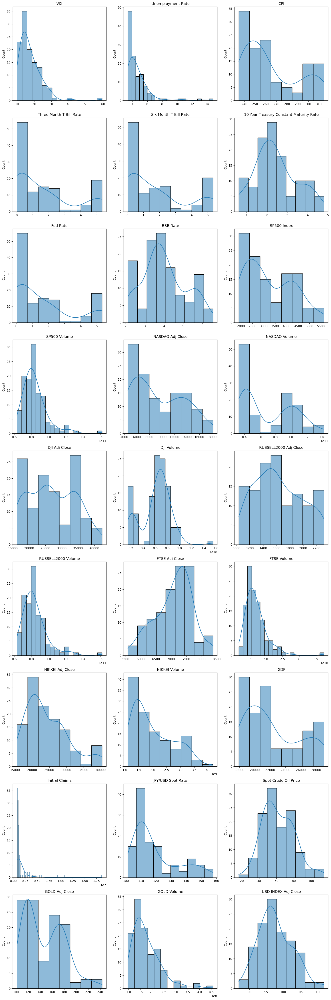

In [34]:
# plt.style.use('seaborn')

n_cols = 3
n_rows = (len(data_clean.columns)-1) // n_cols + 1

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
# fig.suptitle('Histograms of all Features', fontsize=16)

axes = axes.flatten()

for i, column in enumerate(data_clean.columns):
    sns.histplot(data=data_clean, x=column, kde=True, bins='auto', ax=axes[i])
    axes[i].set_title(column)
    axes[i].set_xlabel('')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

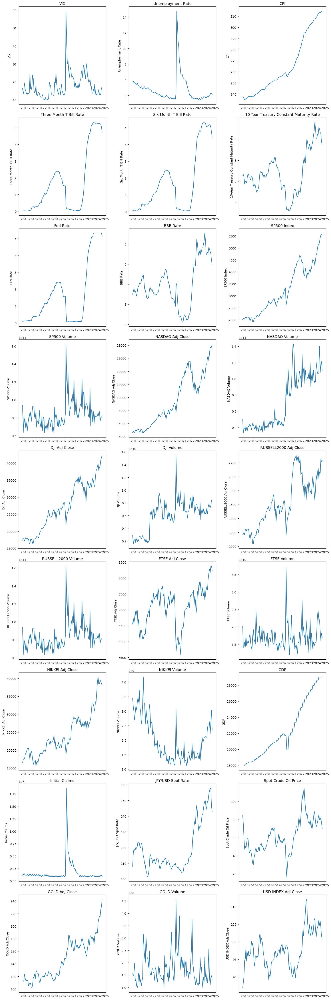

In [35]:
n_cols = 3
n_rows = (len(data_clean.columns)-1) // n_cols + 1

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
# fig.suptitle('All Features', fontsize=16)

axes = axes.flatten()

for i, column in enumerate(data_clean.columns):
    sns.lineplot(data=data_clean, x=data_clean.index, y=column, ax=axes[i])
    axes[i].set_title(column)
    axes[i].set_xlabel('')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [36]:
#Rolling statistics

def calculate_rolling_stats(df, window):
    rolling_mean = df.rolling(window=window).mean()
    rolling_std = df.rolling(window=window).std()
    return rolling_mean, rolling_std

In [37]:

window_size = 6

rolling_mean, rolling_std = calculate_rolling_stats(data_clean, window=window_size)

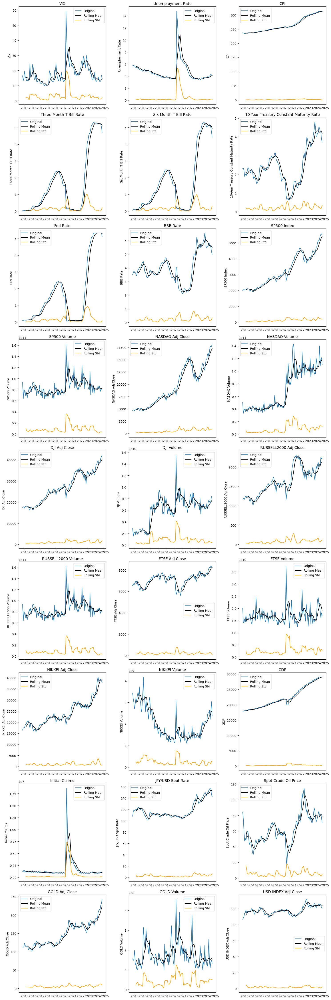

In [38]:

n_cols = 3
n_rows = (len(data_clean.columns)-1) // n_cols + 1

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))

axes = axes.flatten()

for i, column in enumerate(data_clean.columns):
    sns.lineplot(data=data_clean, x=data_clean.index, y=column, label='Original', ax=axes[i])
    sns.lineplot(data=rolling_mean, x=rolling_mean.index, y=rolling_mean[column], color='black', label='Rolling Mean', ax=axes[i])
    sns.lineplot(data=rolling_std, x=rolling_std.index, y=rolling_std[column], color='orange', label='Rolling Std', ax=axes[i])
    axes[i].legend(loc='best')
    axes[i].set_title(column)
    axes[i].set_xlabel('')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [39]:
data_log = np.log1p(data_clean)

In [40]:
data_log

,VIX,Unemployment Rate,CPI,Three Month T Bill Rate,Six Month T Bill Rate,10-Year Treasury Constant Maturity Rate,Fed Rate,BBB Rate,SP500 Index,SP500 Volume,...,FTSE Volume,NIKKEI Adj Close,NIKKEI Volume,GDP,Initial Claims,JPY/USD Spot Rate,Spot Crude Oil Price,GOLD Adj Close,GOLD Volume,USD INDEX Adj Close
Date,,,,,,,,,,,,,,,,,,,,,
2014-10-01,2.863914,1.902108,5.474076,0.019803,0.048790,1.193922,0.086178,1.504077,7.604571,25.263514,...,23.726888,9.705936,21.957778,9.793286,13.959612,4.691623,4.447346,4.733212,18.860121,4.475972
2014-11-01,2.662355,1.916923,5.472199,0.019803,0.067659,1.202972,0.086178,1.532557,7.621107,24.875882,...,23.381170,9.767716,21.872381,9.793286,14.192577,4.764735,4.341074,4.728361,18.809977,4.492673
2014-12-01,2.782230,1.887070,5.469123,0.029559,0.104360,1.166271,0.113329,1.564441,7.632832,25.114547,...,23.361571,9.767196,21.809434,9.793286,13.944784,4.790155,4.099166,4.741273,18.850658,4.513822
2015-01-01,3.018227,1.902108,5.462759,0.029559,0.076961,1.057790,0.104360,1.534714,7.613555,25.071348,...,23.473391,9.779929,21.713364,9.801706,14.178765,4.781222,3.875774,4.823904,19.103950,4.562263
2015-02-01,2.800325,1.871802,5.465280,0.019803,0.067659,1.091923,0.104360,1.536867,7.648735,24.954114,...,23.387612,9.841556,21.813644,9.801706,14.001991,4.785490,3.943134,4.763541,18.649299,4.566949
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-01,2.633327,1.609438,5.750109,1.832581,1.819699,1.701105,1.845300,1.909543,8.567471,25.187445,...,23.816687,10.558125,21.691162,10.275662,13.701223,5.055417,4.394696,5.376666,18.769257,4.660321
2024-06-01,2.613373,1.629241,5.749549,1.830980,1.816452,1.669592,1.845300,1.891605,8.600567,25.054336,...,23.662986,10.586182,21.515806,10.275662,13.984410,5.068023,4.391606,5.375325,18.505355,4.671613
2024-07-01,2.652537,1.667707,5.751092,1.824549,1.793425,1.658228,1.845300,1.876407,8.621763,25.107295,...,23.500079,10.573950,21.667366,10.275662,13.767371,5.065881,4.416428,5.427370,18.747629,4.654912


In [41]:
#Decompose

def decompose_and_plot(series, column, period):
    decomposition = seasonal_decompose(series, model='additive', period=period)

    fig = plt.figure(figsize=(15, 10))
    gs = fig.add_gridspec(2, 3)
    
    fig.suptitle(column, fontsize=20)
    

    #Plot original data
    ax_original = fig.add_subplot(gs[0, :])
    ax_original.plot(series)
    ax_original.set_title('Original')
    ax_original.set_xlabel('')

    #Plot trend
    ax_trend = fig.add_subplot(gs[1, 0])
    ax_trend.plot(decomposition.trend)
    ax_trend.set_title('Trend')

    #Plot seasonal
    ax_seasonal = fig.add_subplot(gs[1, 1])
    ax_seasonal.plot(decomposition.seasonal)
    ax_seasonal.set_title('Seasonal')

    #Plot residual
    ax_residual = fig.add_subplot(gs[1, 2])
    ax_residual.plot(decomposition.resid)
    ax_residual.set_title('Residual')

    plt.tight_layout()
    plt.show()



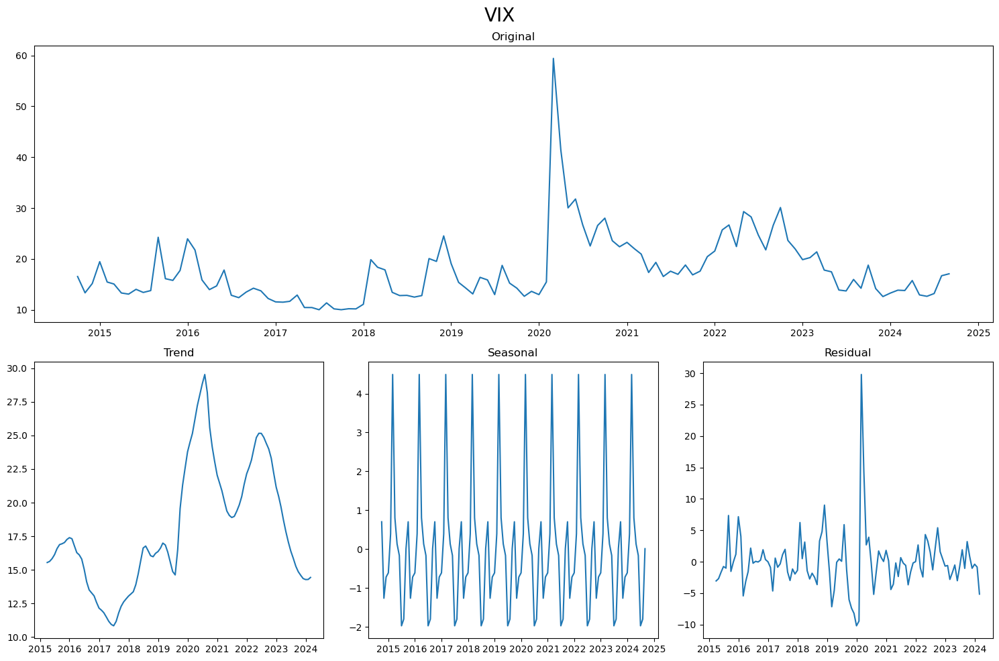

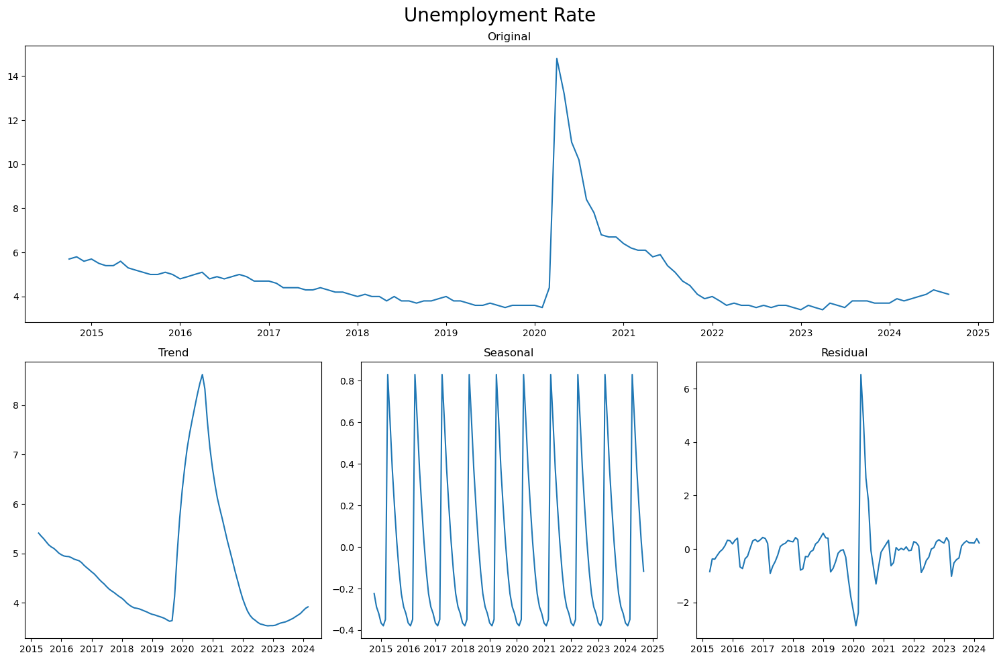

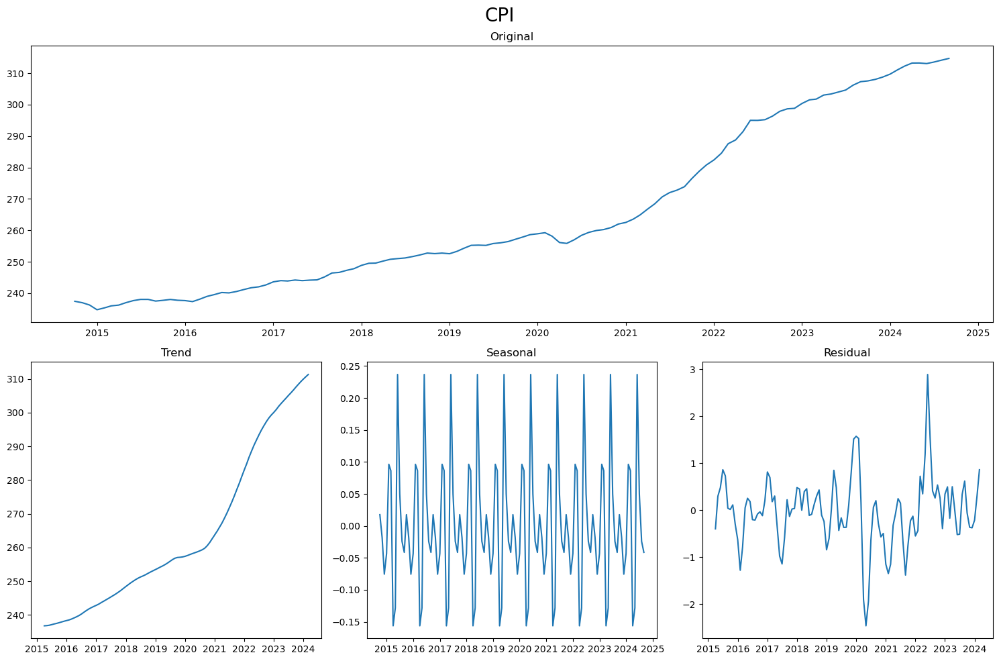

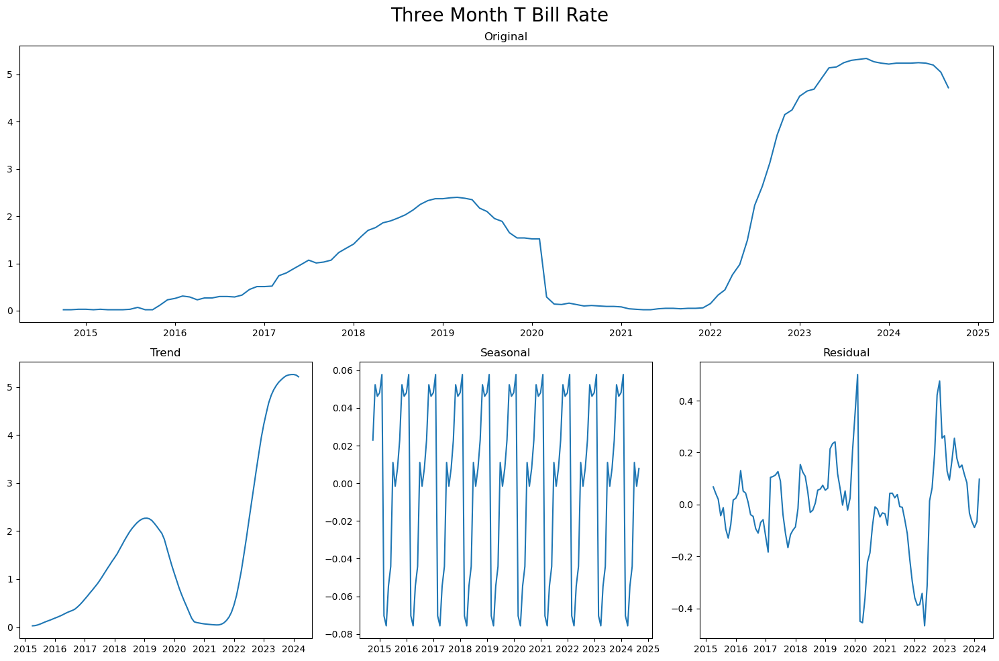

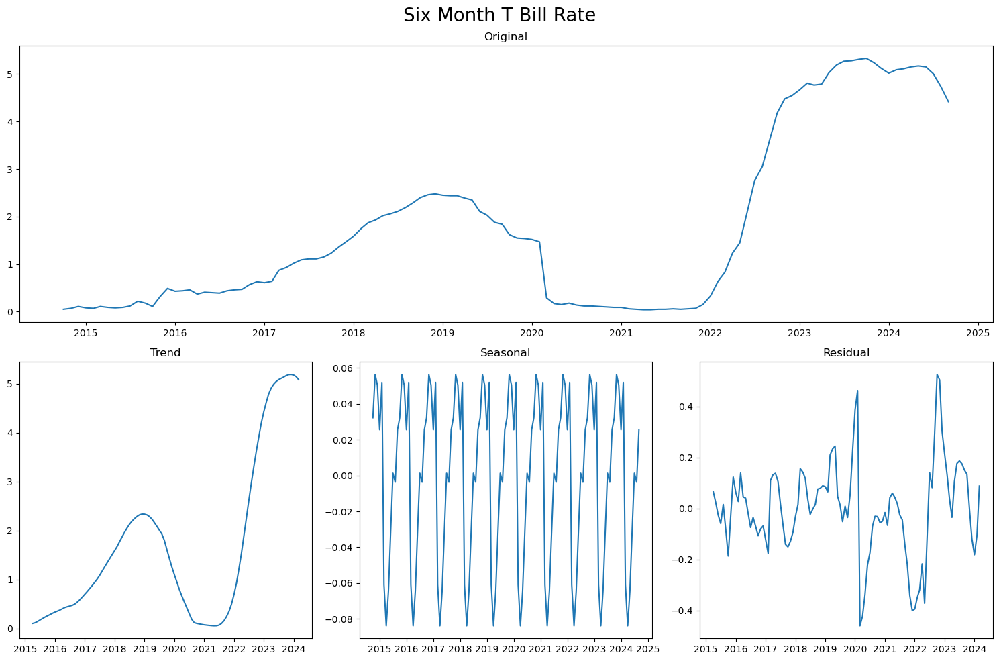

...

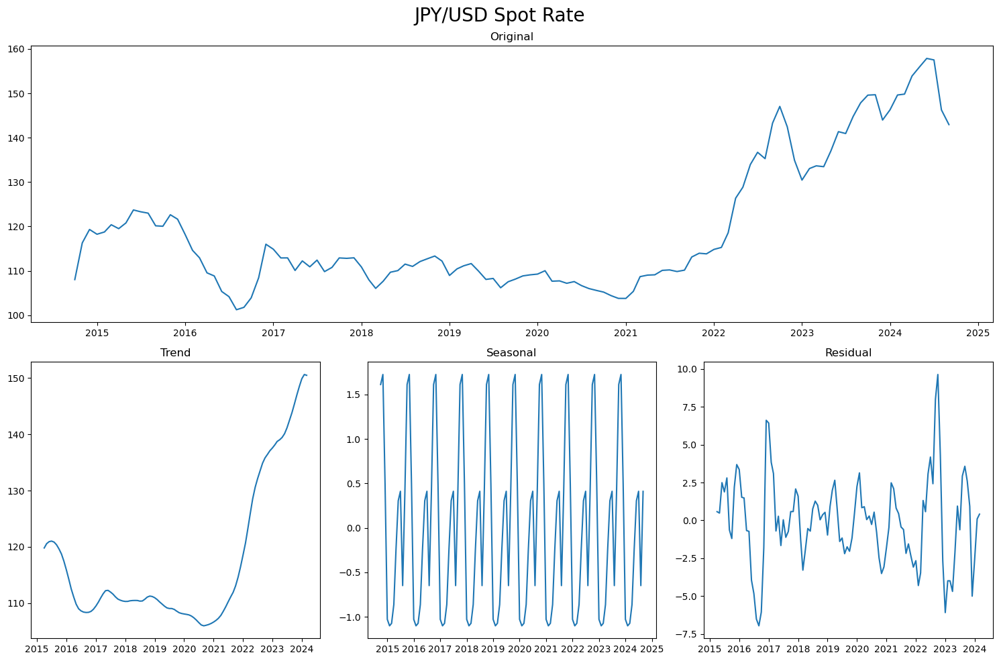

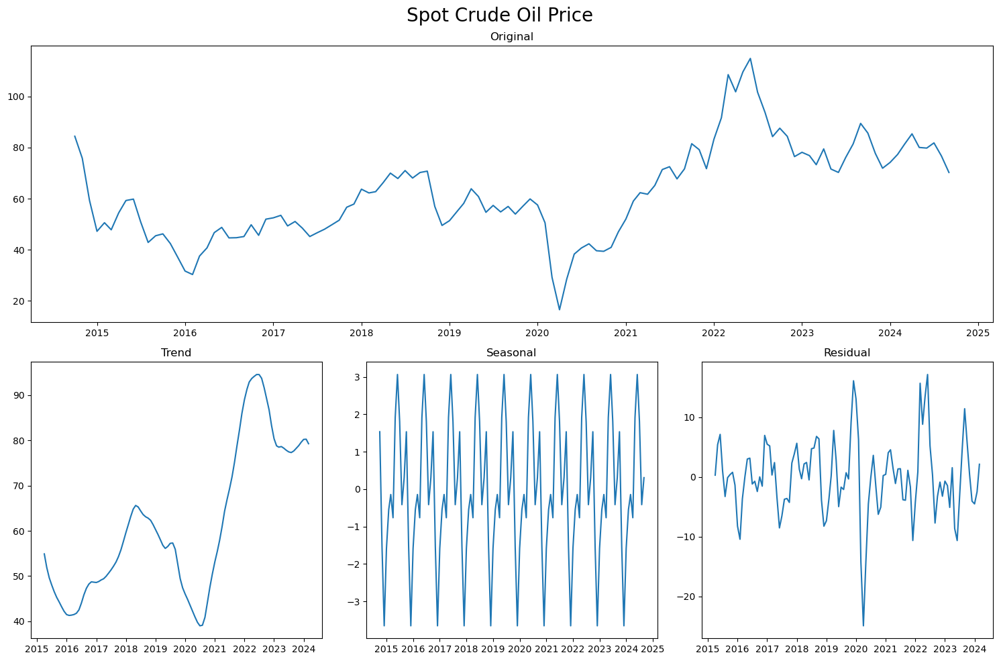

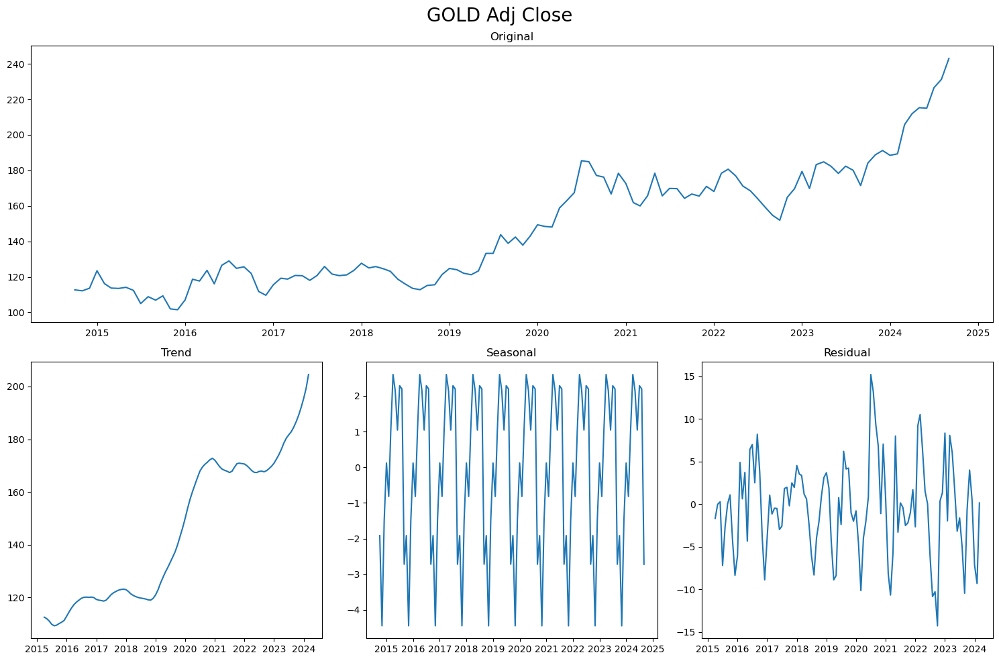

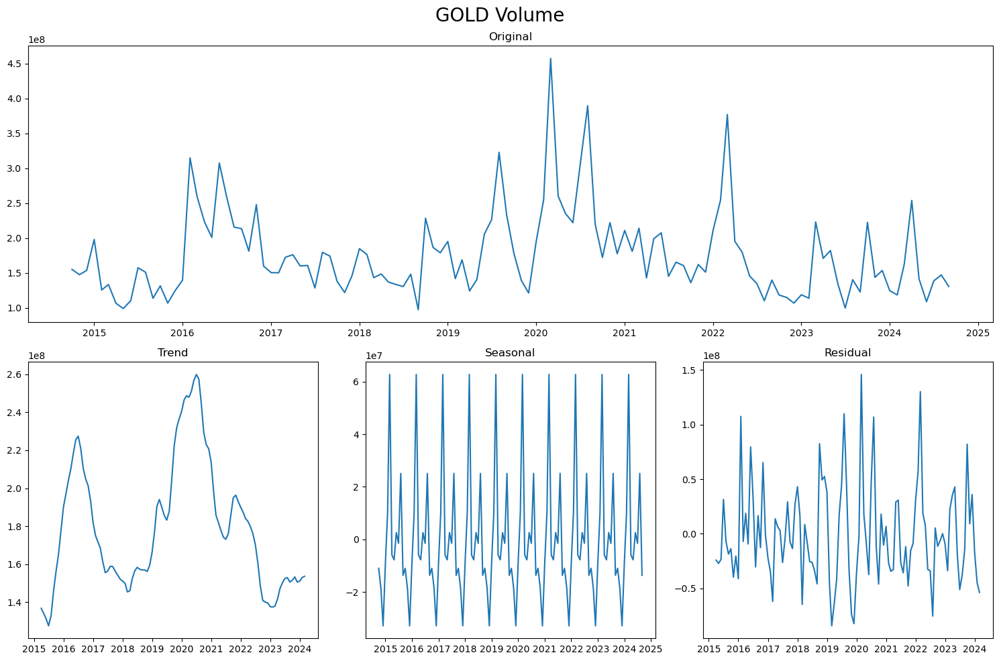

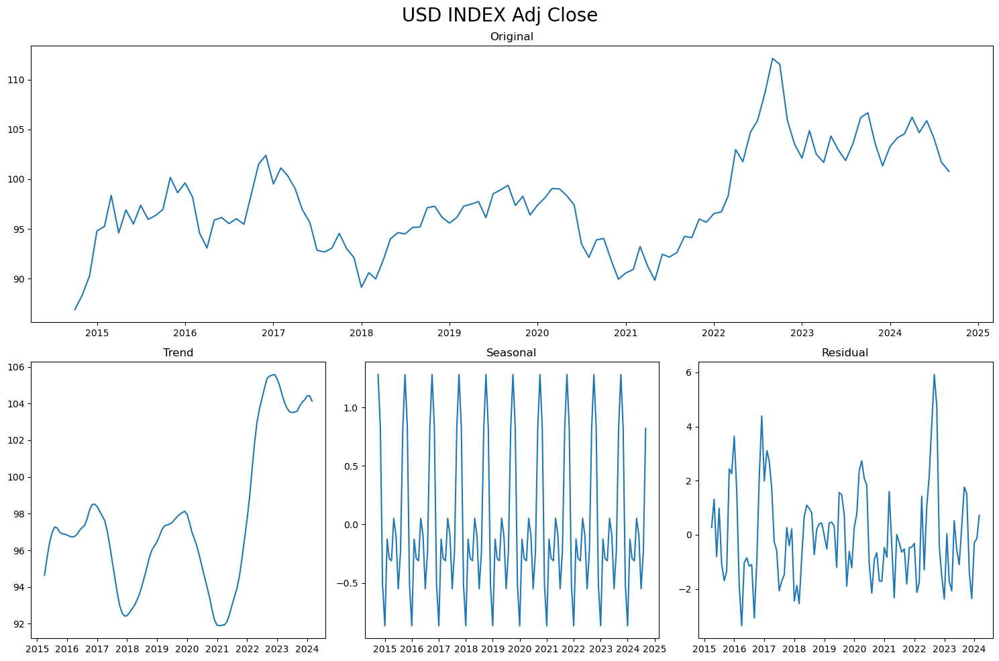

In [42]:
period = 12

for column in data_clean.columns:
    decompose_and_plot(data_clean[column], column, period)

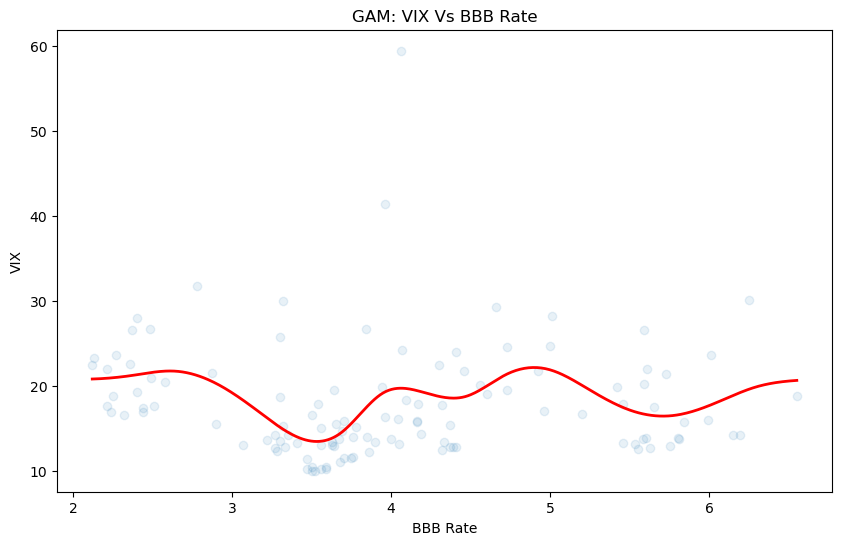

In [43]:
#Generalized Additive Models 

gam = GAM(s(0))
gam.fit(Features_clean['BBB Rate'], VIX)

XX = gam.generate_X_grid(term=0, n=500)
plt.figure(figsize=(10,6))
plt.scatter(Features_clean['BBB Rate'], VIX, alpha=0.1)
plt.plot(XX, gam.predict(XX), color='r', linewidth=2)
plt.title('GAM: VIX Vs BBB Rate')
plt.xlabel('BBB Rate')
plt.ylabel('VIX')
plt.show()



In [44]:
gam.statistics_

{'n_samples': 120,
 'm_features': 1,
 'edof_per_coef': array([6.98183279e-01, 4.87813923e-01, 5.42603892e-01, 3.70145268e-01,
        3.34898377e-01, 6.83995801e-01, 6.16505564e-01, 5.37767483e-01,
        6.08800702e-01, 6.13971641e-01, 4.72820719e-01, 4.74105015e-01,
        4.67808766e-01, 4.46104236e-01, 6.01328621e-01, 4.71332553e-01,
        5.61541947e-01, 3.28391884e-01, 6.53352993e-01, 4.26012193e-04,
        3.50850313e-23]),
 'edof': 9.971898676526232,
 'scale': 38.75482688695575,
 'cov': array([[ 3.43639690e+01,  1.35199216e+01, -4.07693772e+00,
         -7.90782479e+00, -4.18613477e+00, -1.46063003e+00,
         -9.46685102e-01, -1.19100867e+00, -1.24386695e+00,
         -1.24410365e+00, -1.34445457e+00, -1.54511819e+00,
         -1.69307722e+00, -1.63076088e+00, -1.37524226e+00,
         -1.13528794e+00, -1.38502841e+00, -2.64467200e+00,
         -4.76385633e+00, -7.03722121e+00,  1.07198137e+00],
        [ 1.35199216e+01,  6.67012647e+00,  3.15566280e-01,
         -2.453

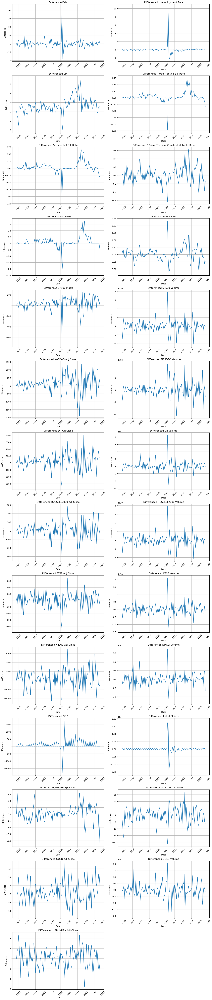

In [45]:
#Difference the Data

differenced_data = data_clean.diff() #First order differencing

differenced_data.iloc[0] = 0 #First entry of differenced data is typically NaN because there is no previous value to subtract from the first observation

num_columns = len(differenced_data.columns)

nrows = (num_columns + 1) // 2


plt.figure(figsize=(15, 5 * nrows))

for i, column in enumerate(differenced_data.columns):
    plt.subplot(nrows, 2, i + 1)
    plt.plot(differenced_data.index, differenced_data[column])
    plt.title(f'Differenced {column}')
    plt.xlabel('Date')
    plt.ylabel('Difference')
    plt.grid(True)
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()



In [46]:
#Check for NaN or infinite values

missing_values = differenced_data.isnull().sum() + (differenced_data == float('inf')).sum() + (differenced_data == float('-inf')).sum()
print(f'Number of missing or ifinite values: {missing_values}')

Number of missing or ifinite values: VIX                                        0
Unemployment Rate                          0
CPI                                        0
Three Month T Bill Rate                    0
Six Month T Bill Rate                      0
10-Year Treasury Constant Maturity Rate    0
Fed Rate                                   0
BBB Rate                                   0
SP500 Index                                0
SP500 Volume                               0
NASDAQ Adj Close                           0
NASDAQ Volume                              0
DJI Adj Close                              0
DJI Volume                                 0
RUSSELL2000 Adj Close                      0
RUSSELL2000 Volume                         0
FTSE Adj Close                             0
FTSE Volume                                0
NIKKEI Adj Close                           0
NIKKEI Volume                              0
GDP                                        0
Initial Claims    